# Introduction aux algorithmes de recherche

CSI 4106 - Automne 2024

Marcel Turcotte  
Version: nov. 5, 2024 08h37

# Préambule

## Citation du jour

## Objectifs d’apprentissage

-   **Comprendre** le rôle des algorithmes de recherche en IA, essentiel
    pour la planification, le raisonnement, et des applications telles
    qu’AlphaGo.

-   **Assimiler** les concepts clés de la recherche : espace d’états,
    état initial/final, actions, modèles de transition, fonctions de
    coût.

-   **Apprendre** les différences et implémentations des algorithmes de
    recherche non-informés (BFS et DFS).

-   **Implémenter** et comparer BFS, DFS en utilisant le problème du
    puzzle à 8 cases.

-   **Analyser** la performance et l’optimalité de divers algorithmes de
    recherche.

L’objectif principal aujourd’hui est de fournir une justification, ainsi
que d’introduire les concepts et la terminologie clés.

# Justification

## Pourquoi étudier ces algorithmes?

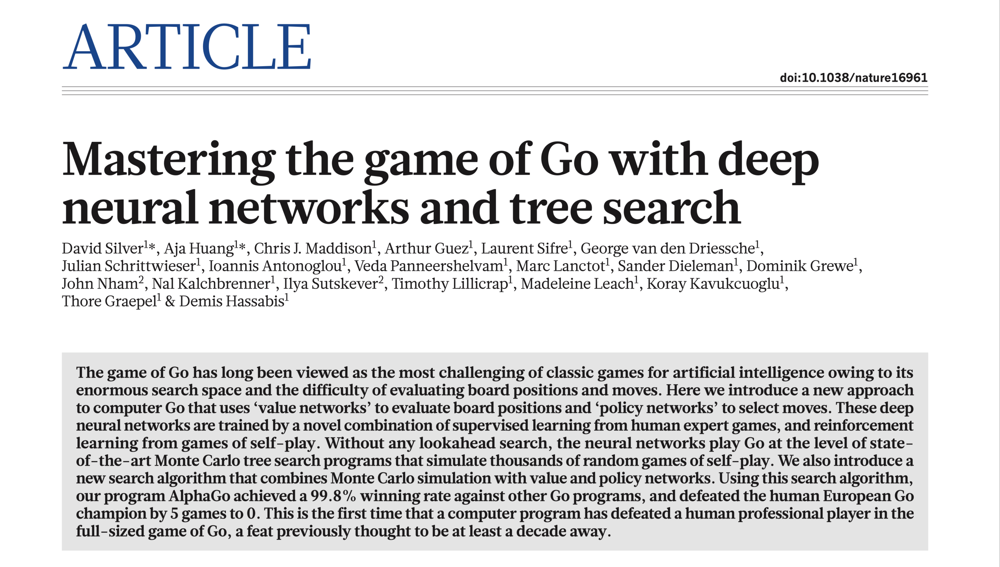

Silver et al. (2016)

## Justification

Nous avons perfectionné notre expertise en **apprentissage automatique**
au point de bien comprendre les **réseaux neuronaux** et le **deep
learning**, ce qui nous permet de développer des modèles simples avec
**Keras**.

. . .

En revanche, les récentes avancées sur les **recherche arborescente de
Monte-Carlo (MCTS)** ont joué un rôle central dans la recherche en
**intelligence artificielle**. Nous passons donc de la concentration sur
le deep learning vers l’**exploration de la recherche**.

## Justification

L’intégration du **deep learning** et de **MCTS** sous-tend des
applications modernes comme
**[AlphaGo](https://deepmind.google/research/breakthroughs/alphago/)**,
**[AlphaZero](https://deepmind.google/discover/blog/alphazero-shedding-new-light-on-chess-shogi-and-go/)**,
et
**[MuZero](https://deepmind.google/discover/blog/muzero-mastering-go-chess-shogi-and-atari-without-rules/)**.

. . .

Les algorithmes de recherche sont donc cruciaux pour la
**planification** et le **raisonnement** et leur importance devrait
croître avec les avancées technologiques.

## Recherche (un historique biaisé)

-   **1968 – A\*** : Recherche heuristique pour la planification en IA.
-   **1970s-1980s – Algorithmes à population** (ex : algorithmes
    génétiques) : Optimisation stochastique pour grands espaces.
-   **1980s – CSP (Problèmes de satisfaction de contraintes)** :
    Recherche dans des espaces structurés avec contraintes explicites.
-   **2013 – DQN** : Apprentissage par renforcement (Q-learning) sur
    données brutes.
-   **2015 – AlphaGo** : Recherche d’arbres de jeu avec MCTS combiné au
    deep learning.
-   **2017 – AlphaZero** : MCTS pour auto-apprentissage dans plusieurs
    domaines.
-   **2019 – MuZero** : Recherche dans environnements inconnus sans
    modèles préexistants.
-   **2020 – Agent57** : Recherche généralisée à travers divers
    environnements (jeux Atari).
-   **2021 – FunSearch** : Généralisation possible des techniques de
    recherche.

## Recherche

<https://youtu.be/g-dKXOlsf98>

[L’ordinateur qui a maîtrisé le jeu de
Go](https://youtu.be/g-dKXOlsf98). [Nature
Video](https://www.youtube.com/@NatureVideoChannel) YouTube le
27-01-2016. (7**m** 52**s**)

En 1997, le Deep Blue d’IBM a vaincu le champion du monde d’échecs en
titre, Garry Kasparov. Cependant, la communauté de l’IA n’a pas été
particulièrement impressionnée, car le principal accomplissement du
système résidait dans sa capacité à évaluer 200 millions de positions
d’échecs par seconde. Après le match, Kasparov a remarqué que Deep Blue
était “aussi intelligent que votre réveil.”

Depuis lors, des avancées significatives ont été réalisées.
Contrairement à Deep Blue, AlphaZero s’appuie sur “des approches plus
intéressantes que la recherche par force brute, qui sont peut-être plus
humaines dans la façon dont elles traitent la position.” Cela a incité
Kasparov à exprimer son approbation, déclarant : “Je ne peux pas cacher
ma satisfaction que \[AlphaZero\] joue avec un style dynamique qui
rappelle le mien !”

## AlphaGo - Le Film

<https://youtu.be/WXuK6gekU1Y>

Oui, **AlphaGo** a réussi à battre le **champion du monde**, Lee
**Sedol**. (1**h** 30**m**)

## AlphaGo2MuZero

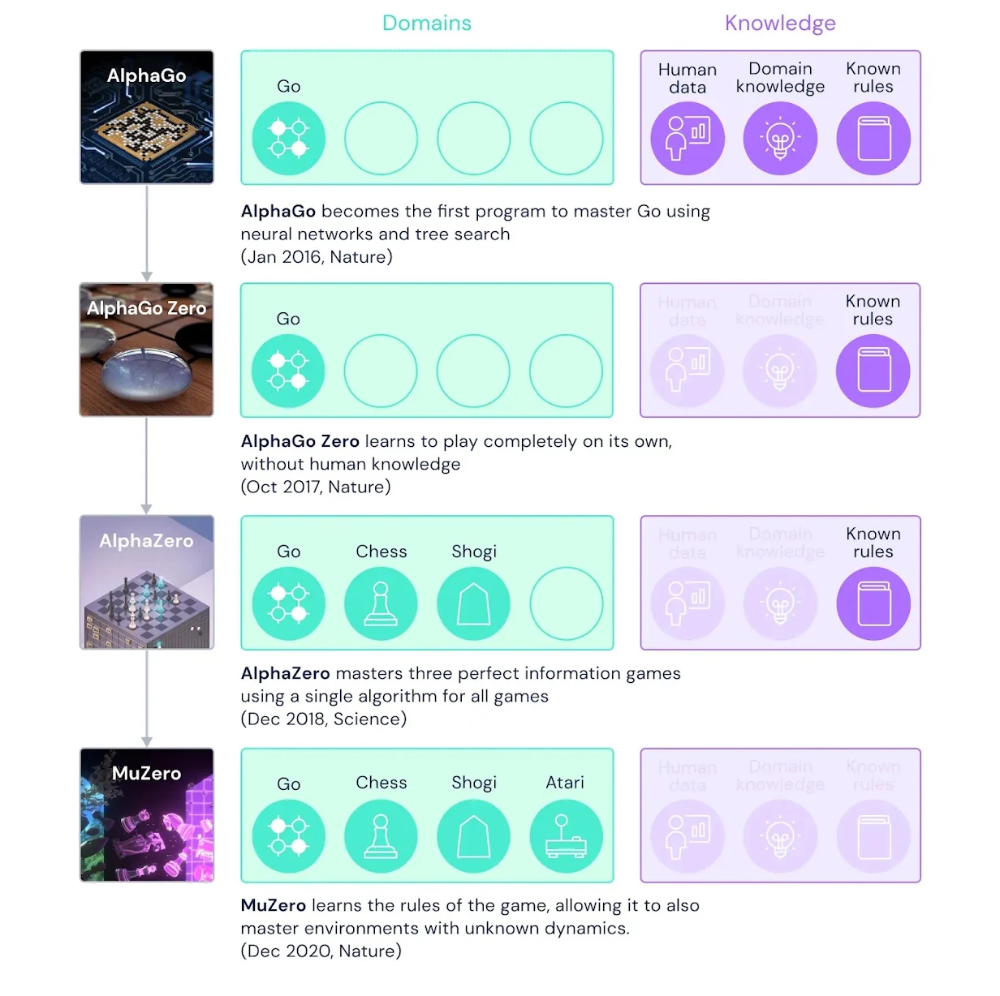

**Attribution**: [MuZero : Maîtriser le Go, les échecs, le shogi et
Atari sans
règles](https://deepmind.google/discover/blog/muzero-mastering-go-chess-shogi-and-atari-without-rules/),
Google DeepMind, 23-12-2020. Schrittwieser et al. (2020)

[David Silver](https://www.davidsilver.uk), chercheur principal chez
DeepMind et professeur à l’University College London, est l’un des
principaux chercheurs sur ces projets. Il a obtenu son doctorat à
l’Université de l’Alberta, où il a été supervisé par [Richard
Sutton](https://apps.ualberta.ca/directory/person/rsutton).

Vous pourriez également vouloir regarder la vidéo suivante : [AlphaGo
Zero : Découvrir de nouvelles
connaissances](https://youtu.be/WXHFqTvfFSw?si=oXsOtb2uxvU1CyKb).
Publiée sur YouTube le 18-10-2017.

# Recherche

## Applications

-   **Cheminement et navigation** : Utilisé en robotique et dans les
    jeux vidéo pour trouver un **chemin** d’un **point de départ** à une
    **destination**.

-   **Résolution de puzzles** : Résolution de problèmes comme le
    **puzzle à 8 cases**, **labyrinthes**, ou **Sudoku**.

-   **Analyse de réseaux** : Analyse de connectivité et des chemins les
    plus courts dans les **réseaux sociaux** ou les **cartes de
    transport**.

-   **Jeux** : Évaluation des coups dans les jeux comme **les échecs**
    ou le **Go**.

## Applications

-   **Planification et ordonnancement** : Planification des tâches dans
    la **gestion de projet** ou l’**ordonnancement de vols**.

-   **Allocation de ressources** : Allocation de ressources dans un
    réseau ou organisation.

-   **Problèmes de configuration** : Assemblage de composants pour
    satisfaire des exigences, comme la configuration d’un système
    informatique.

## Applications

-   **Décisions sous incertitude** : Décisions en **jeux de stratégie en
    temps réel** ou **simulations**.

-   **Narration** : Les modèles de langage peuvent générer des récits
    lorsqu’ils sont guidés par un plan valide provenant d’un
    **planificateur automatisé**. (Simon et Muise 2024)

Les applications des algorithmes de recherche sont à la fois
**nombreuses** et **diverses**.

La recherche a été un domaine actif d’investigation non seulement en
raison de sa large gamme d’applications, mais aussi en raison du
potentiel d’améliorations des algorithmes pour réduire significativement
le temps d’exécution des programmes ou faciliter l’exploration de plus
grands espaces de recherche.

## Plan

1.  **Recherche déterministe et heuristique** : BFS, DFS, A\* pour la
    recherche de chemins et l’optimisation en IA classique.

2.  **CSPs et algorithmes basés sur la population** : Focus sur les
    problèmes structurés et la recherche stochastique.

3.  **Algorithmes de jeux adversariaux** : Minimax, élagage alpha-bêta,
    MCTS pour la prise de décision dans des environnements compétitifs.

Ce cours et les suivants couvriront en détail ces sujets.

## Définition

> ** (Russell et Norvig 2020, 63)**
>
> Lorsqu’il n’est pas immédiatement évident de savoir quelle action
> correcte entreprendre, un agent peut avoir besoin de **planifier à
> l’avance** : considérer une **séquence d’actions** qui forment un
> **chemin** vers un **état objectif**. Un tel agent est appelé un
> **agent de résolution de problèmes**, et le processus computationnel
> qu’il entreprend est appelé **recherche**.

## Terminologie

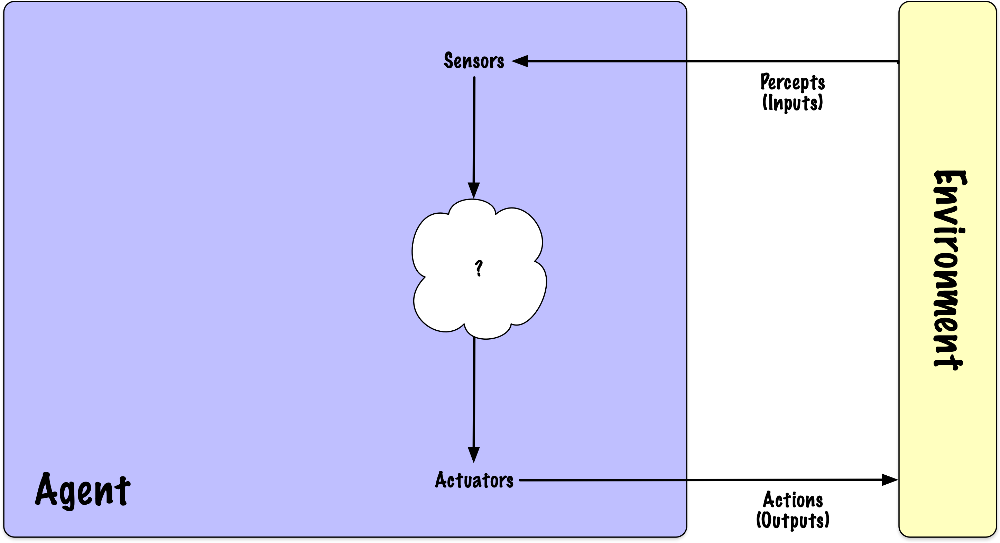

Un **agent** est une entité qui effectue des **actions**. Un **agent
rationnel** est celui qui agit pour atteindre le **“meilleur”
résultat**. Conceptuellement, un **agent** perçoit son environnement par
le biais de **capteurs** et interagit avec celui-ci à l’aide
d’**actionneurs**.

La définition d’un agent en **intelligence artificielle (IA)** partage
certaines similitudes avec la définition **psychologique**, mais il
existe des distinctions clés. En IA, un agent est une **entité
autonome** qui perçoit son **environnement** grâce à des **capteurs** et
agit sur celui-ci à l’aide d’**actionneurs** pour atteindre des
**objectifs spécifiques**. Les deux définitions impliquent la
**perception**, la **prise de décision** et l’**action**.

Cependant, alors que les agents psychologiques sont humains ou
biologiques et impliquent des processus **cognitifs** et **émotionnels
complexes**, les agents en IA sont computationnels et fonctionnent sur
la base d’algorithmes conçus pour **maximiser certaines mesures de
performance** ou **atteindre des objectifs prédéfinis**. L’accent en IA
est davantage mis sur la mise en œuvre technique de ces processus,
tandis qu’en psychologie, l’accent est mis sur la compréhension des
aspects cognitifs et motivationnels de l’agence.

Le concept de **conception agentique** en ingénierie logicielle et en
intelligence artificielle a connu une résurgence de popularité.

## Caractéristiques de l’environnement

-   **Observabilité** : Partiellement observable ou *totalement
    observable*

-   **Composition de l’agent** : *Agent unique* ou multiple

-   **Prédictibilité** : *Déterministe* ou non déterministe

-   **Dépendance d’état** : *Sans état* ou avec état

-   **Dynamique temporelle** : *Statique* ou dynamique

-   **Représentation de l’état** : *Discrète* ou continue

Dans ce cours, les environnements sont supposés être : *totalement
observables*, *agent unique*, *sans état*, *déterministes*, *statiques*
et *discrets*.

Les caractéristiques d’un environnement influencent la complexité de la
résolution de problèmes.

-   Un **environnement totalement observable** permet à l’agent de
    détecter tous les aspects pertinents pour la prise de décision.

-   Dans un **environnement déterministe**, l’agent peut prédire l’état
    suivant en fonction de l’état actuel et de son action subséquente.

-   Les **environnements sans état (épisodiques)** impliquent des
    décisions ou actions indépendantes des actions antérieures, avec des
    expériences divisées en épisodes non reliés. Un exemple est un
    problème de classification.

-   Les **environnements avec état (séquentiels)** nécessitent que le
    résultat de chaque action puisse affecter les décisions futures, car
    la séquence des actions impacte l’état et les choix ultérieurs. Un
    exemple est un jeu d’échecs.

-   Un **environnement dynamique** est caractérisé par des changements
    de contexte pendant que l’agent délibère.

-   Les échecs servent d’exemple d’environnement **discret**, avec un
    nombre fini, bien que grand, d’états. En revanche, un véhicule
    autonome fonctionne dans un environnement à **état continu** et
    **temps continu**.

## Processus de résolution de problèmes

**Recherche** : Le processus implique de simuler des séquences d’actions
jusqu’à ce que l’agent atteigne son objectif. Une séquence réussie est
appelée une **solution**.

Une formulation précise facilite le développement de code réutilisable.

Un environnement caractérisé comme sans état, agent unique, totalement
observable, déterministe, statique et discret implique que la solution à
tout problème dans ce contexte est une séquence fixe d’actions.

-   **Sans état** : Chaque décision est indépendante des actions
    précédentes, ce qui signifie que la solution ne dépend pas de
    l’historique.

-   **Agent unique** : Il n’y a pas d’interaction avec d’autres agents
    qui pourrait introduire de la variabilité.

-   **Totalement observable** : L’agent dispose d’informations complètes
    sur l’environnement, permettant une prise de décision précise.

-   **Déterministe** : Le résultat des actions est prévisible, sans
    aléatoire affectant le résultat.

-   **Statique** : L’environnement ne change pas au fil du temps, les
    conditions restent donc constantes.

-   **Discret** : L’environnement a un nombre fini d’états et d’actions,
    permettant une séquence claire d’étapes.

Je suppose que vous êtes déjà familier avec ces concepts, et donc, ce
cours initial sert principalement de révision.

## Problème de recherche

-   Un ensemble d’**états**, appelé **espace d’états**.

-   Un **état initial** où l’agent commence.

-   Un ou plusieurs **états objectifs** qui définissent des résultats
    réussis.

-   Un ensemble d’**actions** disponibles dans un état donné $s$.

-   Un **modèle de transition** qui détermine l’état suivant en fonction
    de l’état actuel et de l’action sélectionnée.

-   Une **fonction de coût d’action** qui spécifie le coût de
    l’exécution de l’action $a$ dans l’état $s$ pour atteindre l’état
    $s'$.

## Définitions

-   Un **chemin** est défini comme une séquence d’actions.

-   Une **solution** est un chemin qui relie l’état initial à l’état
    objectif.

-   Une **solution optimale** est le chemin avec le coût le plus bas
    parmi toutes les solutions possibles.

Nous supposons que le **coût du chemin** est la somme des coûts
individuels des actions, et que tous les coûts sont positifs. L’espace
d’états peut être conceptualisé comme un **graphe**, où les nœuds
représentent les états et les arêtes correspondent aux actions.

Dans certains problèmes, plusieurs solutions optimales peuvent exister.
Cependant, il est généralement suffisant d’identifier et de rapporter
une seule solution optimale. Fournir toutes les solutions optimales peut
considérablement augmenter la complexité en temps et en espace pour
certains problèmes.

## Exemple : 8-Puzzle

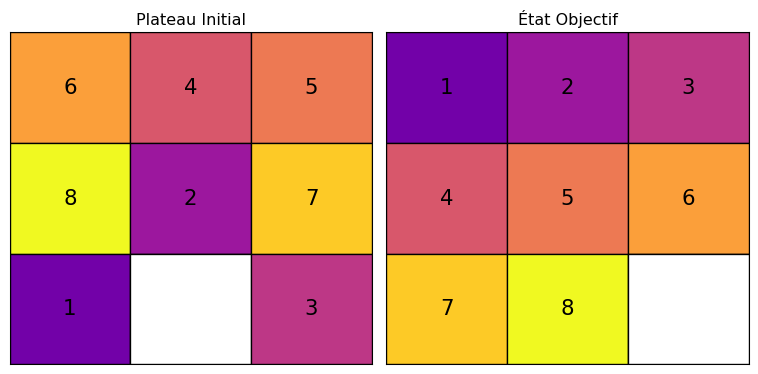

## 8-Puzzle

-   Comment les **états** peuvent-ils être représentés ?

-   Qu’est-ce qui constitue l’**état initial** ?

-   Qu’est-ce qui définit les **actions** ?

-   Qu’est-ce qui constituerait un **chemin** ?

-   Qu’est-ce qui caractérise l’**état objectif** ?

-   Qu’est-ce qui constituerait une **solution** ?

-   Quel devrait être le **coût d’une action** ?

-   Chaque état peut être représenté comme une liste contenant les
    chiffres de 0 à 8. Chaque chiffre correspond à une tuile, et sa
    position dans la liste reflète sa localisation dans la grille, avec
    0 désignant l’espace vide.

-   L’état initial est une permutation des chiffres de 0 à 8.

-   Les actions incluent **gauche**, **droite**, **haut** et **bas**,
    qui impliquent de faire glisser une tuile adjacente dans l’espace
    vide.

-   Un chemin serait une séquence d’actions, par exemple **gauche**,
    **gauche**, **haut**.

-   Le modèle de transition associe un état donné et une action à un
    nouvel état. Toutes les actions ne sont pas réalisables à partir de
    chaque état ; par exemple, si l’espace vide est au bord de la
    grille, seules certaines actions sont possibles, comme bas, haut ou
    gauche.

-   L’état objectif est atteint lorsque la liste est ordonnée de 1 à 8,
    suivi de 0, indiquant que les tuiles sont correctement disposées.
    Combien y a-t-il d’états objectifs ?

-   Une solution serait un chemin valide transformant un état initial en
    un état objectif.

-   Chaque action entraîne un coût de 1.

Combien d’états possibles y a-t-il ?

Il y a 9! = 362 880 états. La force brute est envisageable.

Combien y a-t-il d’états pour le 15-Puzzle ?

15! = 1 307 674 368 000 (1,3 trillion) !

## Arbre de recherche

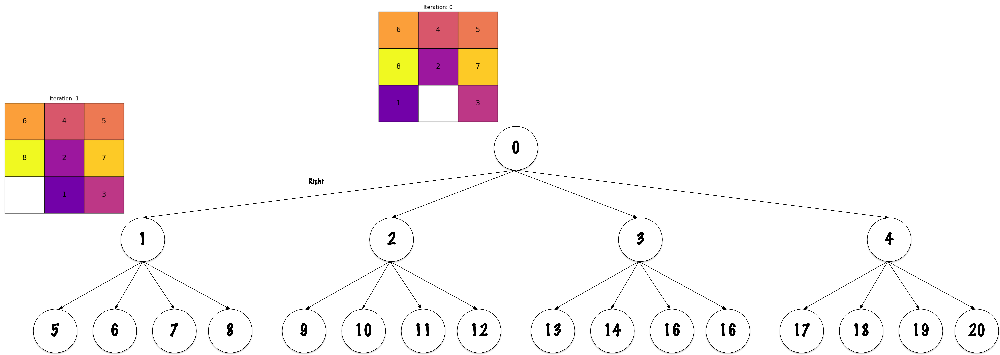

Un **arbre de recherche** est une *structure d’arbre conceptuelle* où
les **nœuds** représentent des *états* dans un **espace d’états**, et
les **arêtes** représentent les **actions** possibles, facilitant
l’exploration systématique pour trouver un **chemin** d’un **état
initial** à un **état objectif**.

Les algorithmes de recherche que nous examinons aujourd’hui construisent
un arbre de recherche, où chaque nœud représente un état au sein de
l’espace d’états et chaque arête représente une action.

Il est important de distinguer entre l’arbre de recherche et l’espace
d’états, qui peut être représenté comme un graphe. La structure de
l’arbre de recherche varie en fonction de l’algorithme utilisé pour
aborder le problème de recherche.

## Arbre de recherche



Un exemple d’**arbre de recherche** pour le **8-Puzzle**. La solution
ici est incomplète.

## Arbre de recherche

-   La **racine** de l’arbre de recherche représente l’**état initial**
    du problème.

-   **Développer** un nœud implique d’évaluer **toutes les actions
    possibles** disponibles à partir de cet état.

-   Le **résultat** d’une action est le nouvel état atteint après avoir
    **appliqué cette action** à l’**état actuel**.

-   À l’instar d’autres structures d’arbres, chaque nœud a un **parent**
    et peut avoir des **enfants**.

Une caractéristique distinctive d’un algorithme de recherche est sa
méthode pour **sélectionner le prochain nœud à développer**.

Les nœuds **racine** et **feuille** sont des exceptions.

## Frontière



Tout état correspondant à un nœud dans l’arbre de recherche est
considéré comme **atteint**. Les nœuds de la **frontière** sont ceux qui
ont été **atteints** mais n’ont **pas encore été développés**.
Ci-dessus, il y a **10 nœuds développés** et **11 nœuds de frontière**,
ce qui donne un total de 21 nœuds qui ont été **atteints**.

## Frontière

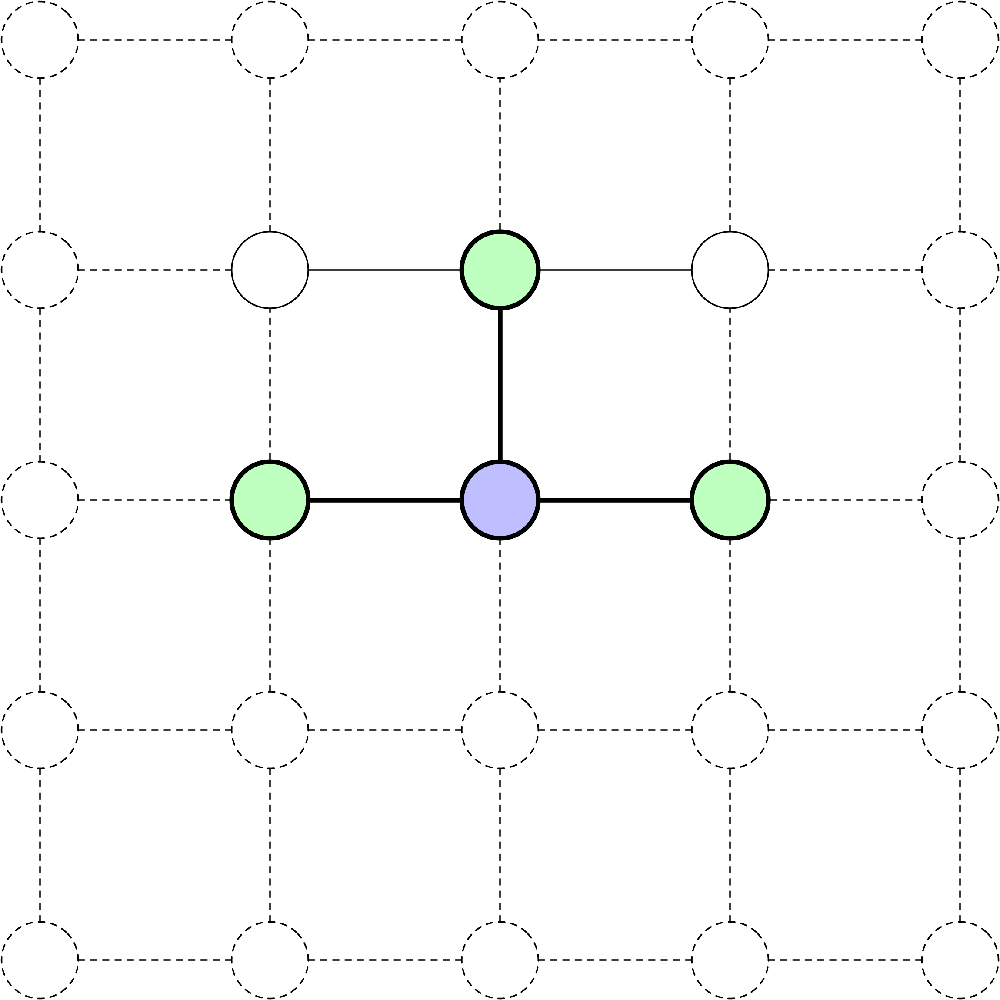

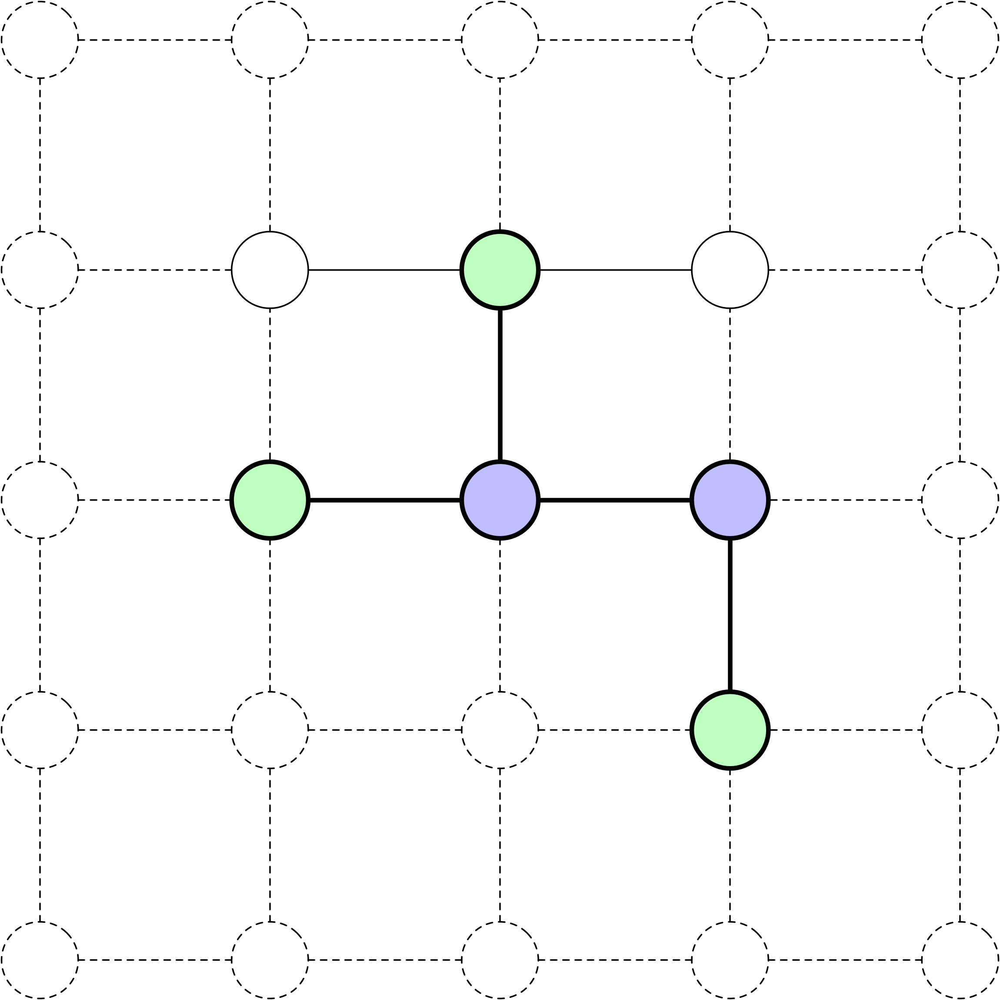

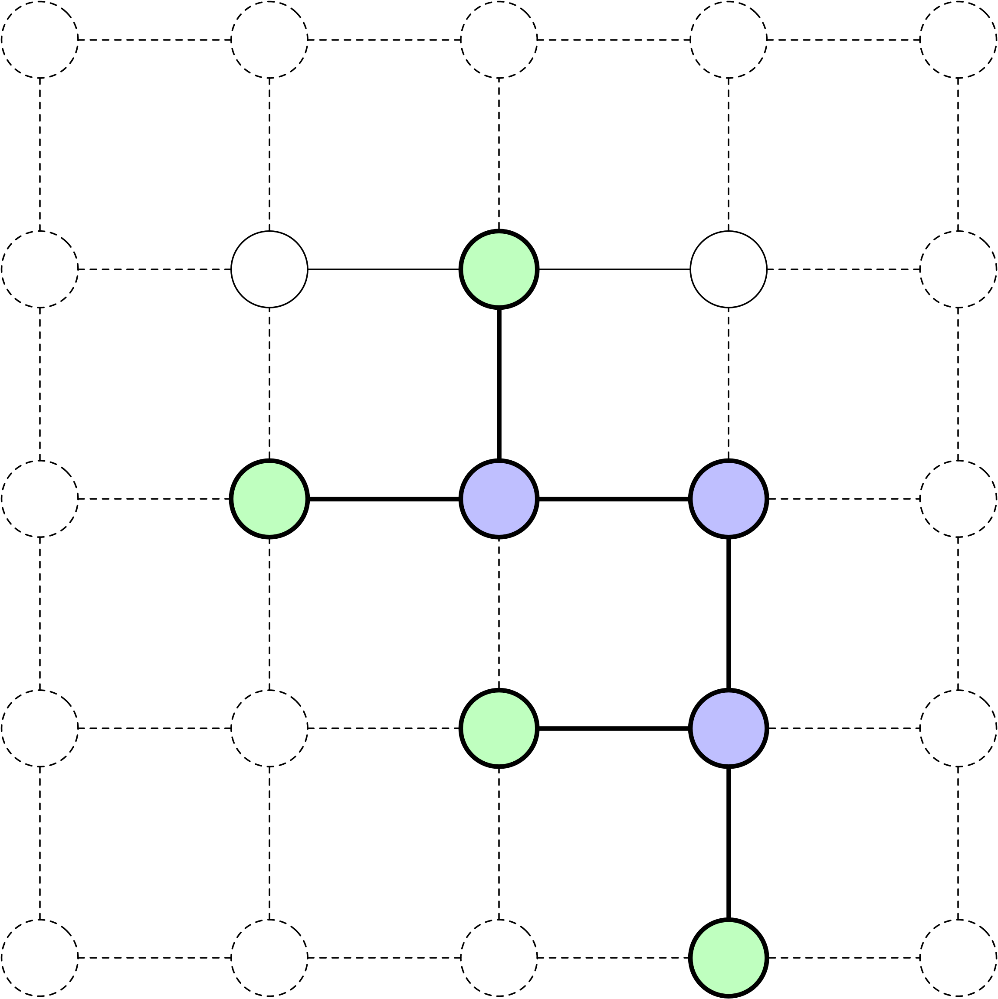

Dans le 8-Puzzle, quatre actions sont possibles : glisser à **gauche**,
à **droite**, vers le **haut** ou vers le **bas**. La recherche peut
être visualisée sur une grille : **nœuds violets** : états développés,
**nœuds verts** : états de la frontière (atteints mais non développés).

Les diagrammes correspondent à l’arbre de recherche présenté sur la page
précédente. Par exemple, l’état initial peut être développé en utilisant
trois actions : glisser à gauche, à droite et vers le haut. Le nœud (2,
3) ne peut être développé qu’en glissant vers le bas, tandis que le nœud
(3, 3) peut être développé en glissant à gauche et vers le bas.

## Frontière

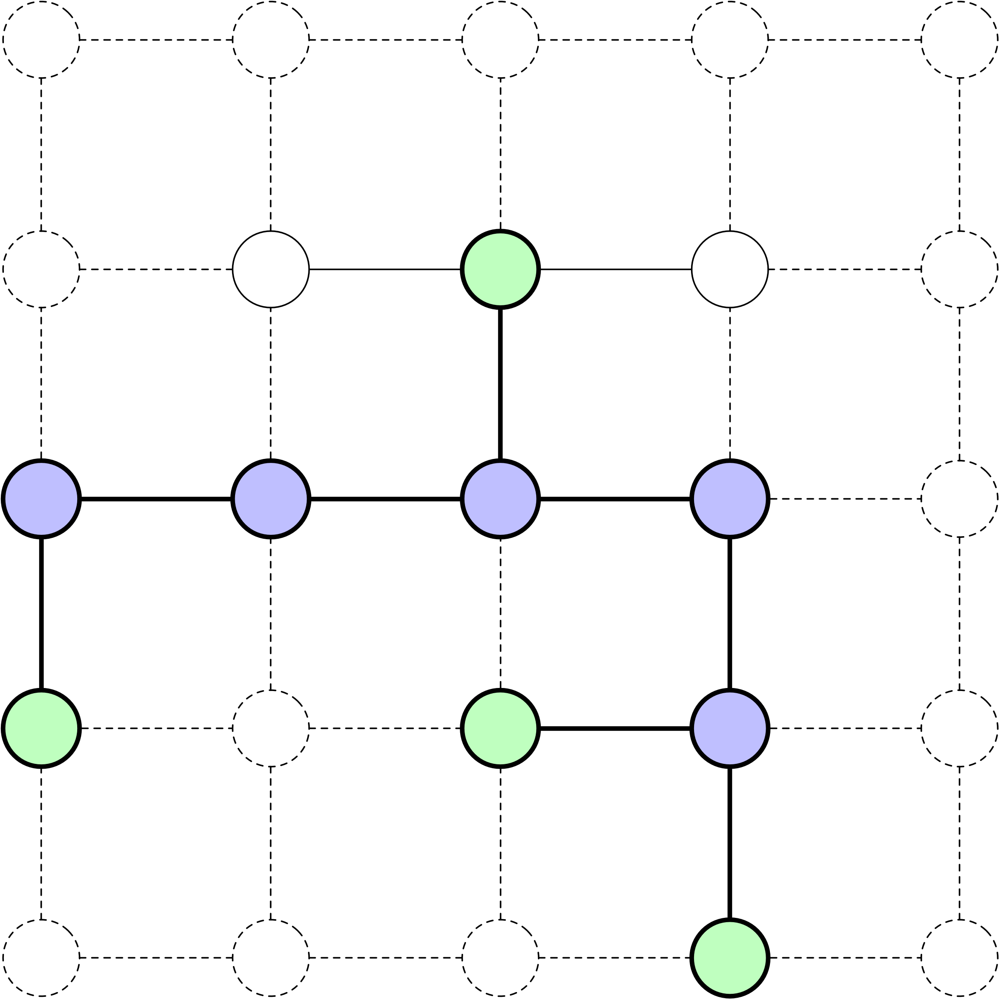

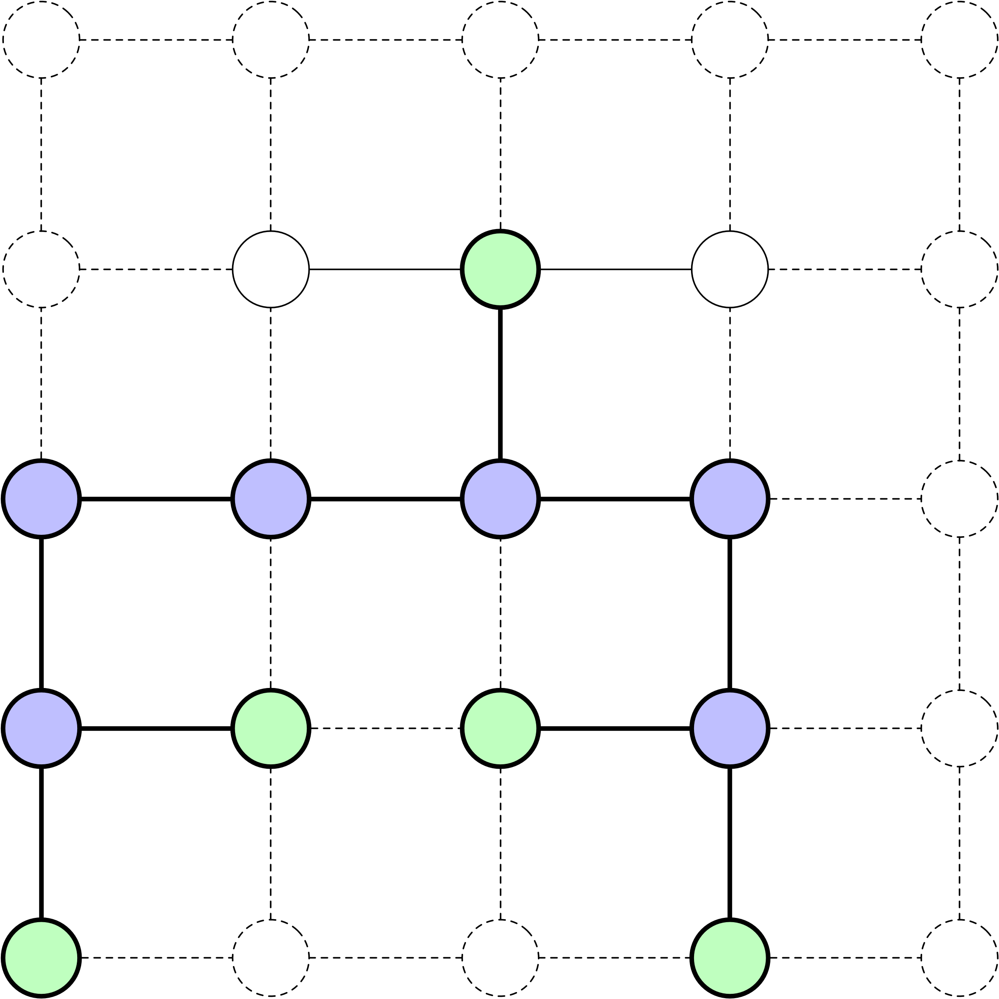

# Recherche non informée

## Définition

Une **recherche non informée** est une stratégie de recherche qui
explore l’espace de recherche en utilisant uniquement les informations
disponibles dans la définition du problème, sans aucune connaissance
spécifique au domaine, en évaluant les nœuds uniquement sur la base de
leurs propriétés intrinsèques plutôt que sur des coûts estimés ou des
heuristiques.

## Représentation de l’état

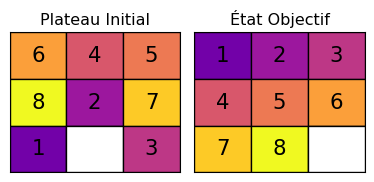

In [5]:
initial_state_8 = [6, 4, 5,
                   8, 2, 7,
                   1, 0, 3]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

Les états sont représentés comme des **listes** de chiffres. `0`
représente la **tuile vide**.

## `is_goal`

In [6]:
def is_goal(state, goal_state):
    """Détermine si un état donné correspond à l'état objectif."""
    return state == goal_state

Méthode auxiliaire.

## `expand`

In [7]:
def expand(state):
    """Génère les états successeurs en déplaçant la tuile vide dans toutes les directions possibles."""
    size = int(len(state) ** 0.5) # Déterminer la taille du puzzle (3 pour le 8-Puzzle, 4 pour le 15-Puzzle)
    idx = state.index(0) # Trouver l'index de la tuile vide représentée par 0
    x, y = idx % size, idx // size # Convertir l'index en coordonnées (x, y)
    neighbors = []

    # Définir les mouvements possibles : Gauche, Droite, Haut, Bas
    moves = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    for dx, dy in moves:
        nx, ny = x + dx, y + dy
        # Vérifier si la nouvelle position est dans les limites du puzzle
        if 0 <= nx < size and 0 <= ny < size:
            n_idx = ny * size + nx
            new_state = state.copy()
            # Échanger la tuile vide avec la tuile adjacente
            new_state[idx], new_state[n_idx] = new_state[n_idx], new_state[idx]
            neighbors.append(new_state)
    return neighbors

## `expand`

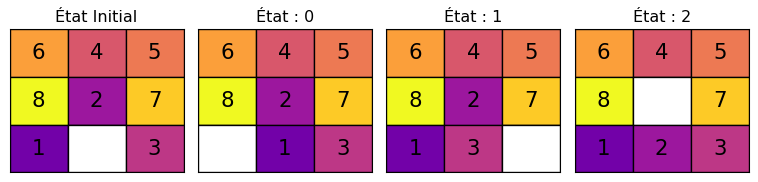

In [9]:
expand(initial_state_8)

[[6, 4, 5, 8, 2, 7, 0, 1, 3],
 [6, 4, 5, 8, 2, 7, 1, 3, 0],
 [6, 4, 5, 8, 0, 7, 1, 2, 3]]

## `is_empty`

In [10]:
def is_empty(frontier):
    """Vérifie si la frontière est vide."""
    return len(frontier) == 0

Si la frontière devient vide (plus de nœuds à développer), le problème
n’a pas de solution.

Existe-t-il des plateaux de 8-Puzzle qui n’ont pas de solutions ?

La résolubilité du 8-Puzzle dépend du nombre d’**inversions** dans
l’état initial. Une inversion est une paire de tuiles où une tuile avec
un numéro plus élevé précède une tuile avec un numéro plus bas lorsque
le puzzle est vu comme une séquence (en excluant la tuile vide).

## `print_solution`

In [11]:
def print_solution(solution):
    """Affiche la séquence d'étapes de l'état initial à l'état objectif."""
    size = int(len(solution[0]) ** 0.5)
    for step, state in enumerate(solution):
        print(f"Étape {step} :")
        for i in range(size):
            row = state[i*size:(i+1)*size]
            print(' '.join(str(n) if n != 0 else ' ' for n in row))
        print()

## Cycles

Un chemin qui revisite les mêmes états forme un **cycle**.

Permettre des cycles rendrait l’**arbre de recherche** résultant
**infini**.

Pour éviter cela, nous surveillons les états qui ont été atteints, bien
que cela entraîne un **coût en mémoire**.

# Recherche en largeur

## Recherche en largeur

In [12]:
from collections import deque

La **recherche en largeur (BFS)** utilise une **file d’attente** pour
gérer les nœuds de la frontière, également connus sous le nom de liste
ouverte.

## Recherche en largeur

In [13]:
def bfs(initial_state, goal_state):
    frontier = deque() # Initialiser la file d'attente pour BFS
    frontier.append((initial_state, [])) # Chaque élément est un tuple : (état, chemin)

    explored = set()
    explored.add(tuple(initial_state))

    iterations = 0 # utilisé simplement pour comparer les algorithmes

    while not is_empty(frontier):
        current_state, path = frontier.popleft()

        if is_goal(current_state, goal_state):
            print(f"Nombre d'itérations : {iterations}")
            return path + [current_state] # Retourner le chemin réussi

        iterations = iterations + 1

        for neighbor in expand(current_state):
            neighbor_tuple = tuple(neighbor)
            if neighbor_tuple not in explored:
                explored.add(neighbor_tuple)
                frontier.append((neighbor, path + [current_state]))

    return None # Aucune solution trouvée

Trouver le **chemin le plus court** de l’état initial à l’état objectif.

## Cas simple

Nombre d'itérations : 12

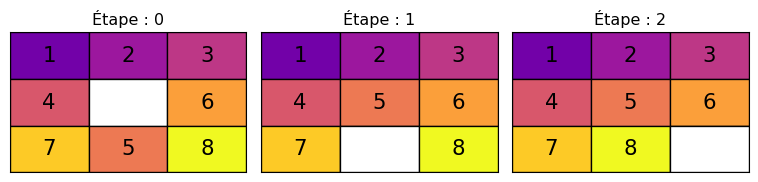

In [15]:
initial_state_8 = [1, 2, 3,
                   4, 0, 6,
                   7, 5, 8]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

bfs(initial_state_8, goal_state_8)

Nombre d'itérations : 12

[[1, 2, 3, 4, 0, 6, 7, 5, 8],
 [1, 2, 3, 4, 5, 6, 7, 0, 8],
 [1, 2, 3, 4, 5, 6, 7, 8, 0]]

## Cas difficile

In [16]:
initial_state_8 = [6, 4, 5,
                   8, 2, 7,
                   1, 0, 3]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

print("Résolution du 8-Puzzle avec la recherche en largeur (BFS)...")

solution_8_bfs = bfs(initial_state_8, goal_state_8)

if solution_8_bfs:
    print(f"Solution BFS trouvée en {len(solution_8_bfs) - 1} mouvements :")
    print_solution(solution_8_bfs)
else:
    print("Aucune solution trouvée pour le 8-Puzzle en utilisant BFS.")

Résolution du 8-Puzzle avec la recherche en largeur (BFS)...
Nombre d'itérations : 145605
Solution BFS trouvée en 25 mouvements :
Étape 0 :
6 4 5
8 2 7
1   3

Étape 1 :
6 4 5
8 2 7
  1 3

Étape 2 :
6 4 5
  2 7
8 1 3

Étape 3 :
6 4 5
2   7
8 1 3

Étape 4 :
6   5
2 4 7
8 1 3

Étape 5 :
  6 5
2 4 7
8 1 3

Étape 6 :
2 6 5
  4 7
8 1 3

Étape 7 :
2 6 5
4   7
8 1 3

Étape 8 :
2 6 5
4 1 7
8   3

Étape 9 :
2 6 5
4 1 7
  8 3

Étape 10 :
2 6 5
  1 7
4 8 3

Étape 11 :
2 6 5
1   7
4 8 3

Étape 12 :
2 6 5
1 7  
4 8 3

Étape 13 :
2 6 5
1 7 3
4 8  

Étape 14 :
2 6 5
1 7 3
4   8

Étape 15 :
2 6 5
1   3
4 7 8

Étape 16 :
2   5
1 6 3
4 7 8

Étape 17 :
2 5  
1 6 3
4 7 8

Étape 18 :
2 5 3
1 6  
4 7 8

Étape 19 :
2 5 3
1   6
4 7 8

Étape 20 :
2   3
1 5 6
4 7 8

Étape 21 :
  2 3
1 5 6
4 7 8

Étape 22 :
1 2 3
  5 6
4 7 8

Étape 23 :
1 2 3
4 5 6
  7 8

Étape 24 :
1 2 3
4 5 6
7   8

Étape 25 :
1 2 3
4 5 6
7 8  


## Arbre de recherche BFS



L’arbre de recherche ci-dessus illustre les 20 premières itérations de
la recherche en largeur (BFS) pour l’objectif initial spécifié.

# Recherche en profondeur

## Recherche en profondeur

In [17]:
def dfs(initial_state, goal_state):
    frontier = [(initial_state, [])] # Chaque élément est un tuple : (état, chemin)

    explored = set()
    explored.add(tuple(initial_state))

    iterations = 0

    while not is_empty(frontier):
        current_state, path = frontier.pop()

        if is_goal(current_state, goal_state):
            print(f"Nombre d'itérations : {iterations}")
            return path + [current_state] # Retourner le chemin réussi

        iterations = iterations + 1

        for neighbor in expand(current_state):
            neighbor_tuple = tuple(neighbor)
            if neighbor_tuple not in explored:
                explored.add(neighbor_tuple)
                frontier.append((neighbor, path + [current_state]))

    return None # Aucune solution trouvée

Quel est le comportement de la **recherche en profondeur (DFS)** ?

La **recherche en profondeur (DFS)** développe constamment le nœud le
plus profond.

Quand le processus d’approfondissement s’arrête-t-il ?

Il cesse lorsque tous les nœuds enfants correspondent à des états déjà
visités.

Que se passe-t-il ensuite ?

L’algorithme revient en arrière jusqu’au nœud le plus récent de la
frontière.

Si tous les enfants de ce nœud correspondent également à des états déjà
visités, l’algorithme continue de revenir en arrière.

## Arbre de recherche DFS

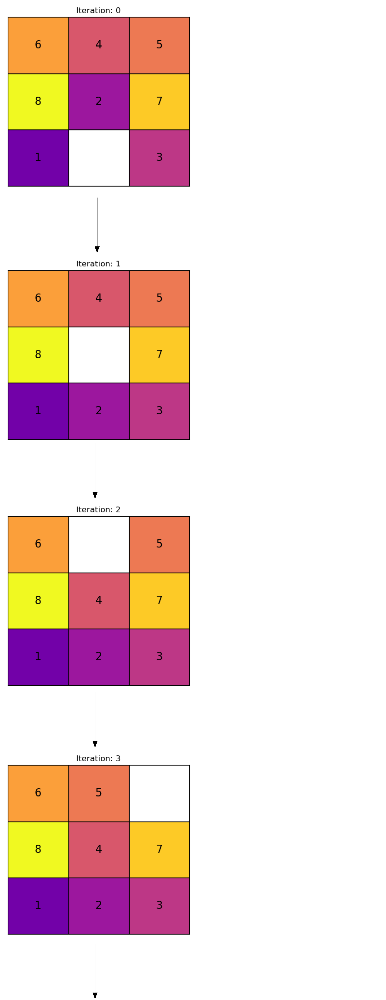

## Arbre de recherche DFS

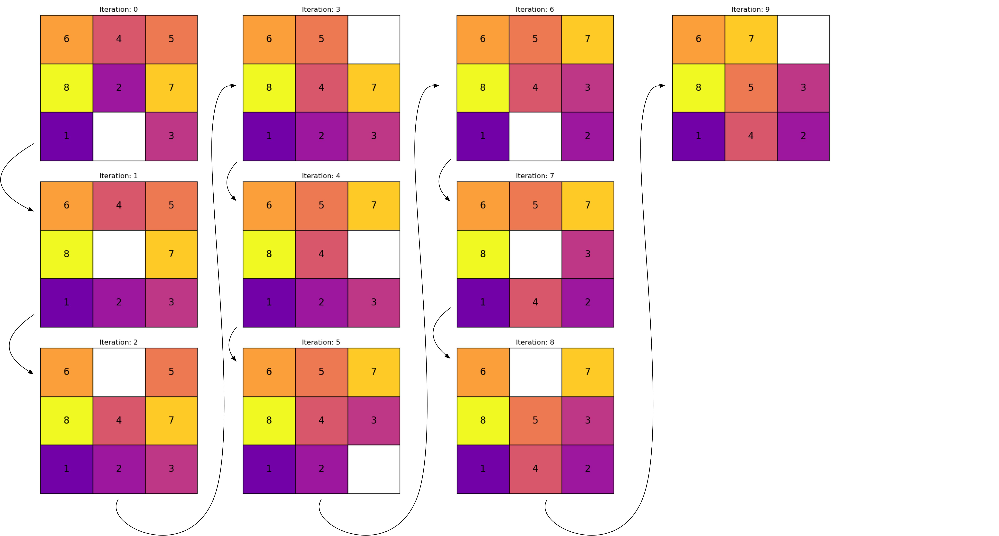

## Cas Simple

Nombre d'itérations : 2

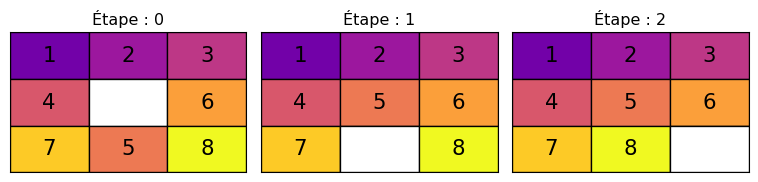

In [19]:
initial_state_8 = [1, 2, 3,
                   4, 0, 6,
                   7, 5, 8]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

bfs(initial_state_8, goal_state_8)

Nombre d'itérations : 12

[[1, 2, 3, 4, 0, 6, 7, 5, 8],
 [1, 2, 3, 4, 5, 6, 7, 0, 8],
 [1, 2, 3, 4, 5, 6, 7, 8, 0]]

## Cas Difficile

In [20]:
initial_state_8 = [6, 4, 5,
                   8, 2, 7,
                   1, 0, 3]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

print("Résolution du 8-Puzzle avec DFS...")

solution_8_bfs = dfs(initial_state_8, goal_state_8)

if solution_8_bfs:
    print(f"Solution DFS trouvée en {len(solution_8_bfs) - 1} mouvements :")
    print_solution(solution_8_bfs)
else:
    print("Aucune solution trouvée pour le 8-Puzzle en utilisant DFS.")

Résolution du 8-Puzzle avec DFS...
Nombre d'itérations : 1187
Solution DFS trouvée en 1157 mouvements :
Étape 0 :
6 4 5
8 2 7
1   3

Étape 1 :
6 4 5
8   7
1 2 3

Étape 2 :
6   5
8 4 7
1 2 3

Étape 3 :
6 5  
8 4 7
1 2 3

Étape 4 :
6 5 7
8 4  
1 2 3

Étape 5 :
6 5 7
8 4 3
1 2  

Étape 6 :
6 5 7
8 4 3
1   2

Étape 7 :
6 5 7
8   3
1 4 2

Étape 8 :
6   7
8 5 3
1 4 2

Étape 9 :
6 7  
8 5 3
1 4 2

Étape 10 :
6 7 3
8 5  
1 4 2

Étape 11 :
6 7 3
8 5 2
1 4  

Étape 12 :
6 7 3
8 5 2
1   4

Étape 13 :
6 7 3
8   2
1 5 4

Étape 14 :
6   3
8 7 2
1 5 4

Étape 15 :
6 3  
8 7 2
1 5 4

Étape 16 :
6 3 2
8 7  
1 5 4

Étape 17 :
6 3 2
8 7 4
1 5  

Étape 18 :
6 3 2
8 7 4
1   5

Étape 19 :
6 3 2
8   4
1 7 5

Étape 20 :
6   2
8 3 4
1 7 5

Étape 21 :
6 2  
8 3 4
1 7 5

Étape 22 :
6 2 4
8 3  
1 7 5

Étape 23 :
6 2 4
8 3 5
1 7  

Étape 24 :
6 2 4
8 3 5
1   7

Étape 25 :
6 2 4
8   5
1 3 7

Étape 26 :
6   4
8 2 5
1 3 7

Étape 27 :
6 4  
8 2 5
1 3 7

Étape 28 :
6 4 5
8 2  
1 3 7

Étape 29 :
6 4 5
8   2
1 3 7

Étape 

## Remarques

-   La **recherche en largeur (BFS)** identifie la solution optimale, 25
    mouvements, en 145 605 itérations.

-   La **recherche en profondeur (DFS)** découvre une solution
    impliquant 1 157 mouvements en 1 187 itérations.

Comment découvrir des solutions **plus efficacement** ?

La **recherche en profondeur (DFS)** produira-t-elle toujours des
solutions sous-optimales ?

Non, si la solution optimale se trouve le long du chemin parcouru par la
recherche en profondeur (DFS) dans l’arbre de recherche, alors DFS
identifiera effectivement la solution optimale.

Est-il possible que DFS découvre des solutions supérieures à la solution
optimale ?

Certainement pas ; de telles solutions seraient soit invalides
(impliquant des mouvements impossibles), soit indiqueraient une erreur
dans votre estimation.

Cela signifie-t-il que la recherche en profondeur (DFS) n’a pas
d’applications pratiques ?

Quand est-il approprié d’utiliser DFS ?

La recherche en largeur (BFS) étend sa frontière systématiquement dans
toutes les directions, ce qui entraîne une croissance rapide des besoins
en mémoire.

En revanche, l’utilisation de la mémoire de DFS est limitée par le
nombre de mouvements nécessaires pour atteindre ses points de retour en
arrière ou par la longueur du chemin de la première solution trouvée.
Dans tous les scénarios, DFS continue d’étendre la frontière dans une
direction.

Dans certaines applications où toutes les solutions possibles doivent
être explorées, tout l’espace de recherche doit être parcouru. Utiliser
BFS dans ces cas serait prohibitif en termes de mémoire. Cependant, DFS
peut explorer l’ensemble de l’espace avec une utilisation minimale de la
mémoire.

Le langage de programmation Prolog inclut un algorithme de retour en
arrière intégré qui énumère toutes les solutions possibles. Le retour en
arrière est une variante de DFS efficace en mémoire.

La recherche limitée en profondeur et la recherche en approfondissement
itératif seraient des algorithmes de recherche non informée alternatifs.

Trouver des solutions plus efficacement nécessite une connaissance du
domaine.

# Prologue

## Résumé

-   Justification pour l’étude de la recherche
-   Terminologie et concepts clés
-   Algorithmes de recherche non informée
-   Recherche en largeur (BFS)
-   Recherche en profondeur (DFS)
-   Implémentations

-   **Justification pour l’étude de la recherche :**
    -   Mise en avant de la transition de la focalisation exclusive sur
        l’apprentissage automatique à l’intégration des algorithmes de
        recherche.
    -   Souligné le rôle de la recherche dans les systèmes d’IA avancés
        comme AlphaGo, AlphaZero et MuZero.
    -   Noté que les algorithmes de recherche sont cruciaux pour la
        planification, le raisonnement, et seront de plus en plus
        importants.
-   **Chronologie historique des algorithmes de recherche :**
    -   Présenté une chronologie biaisée de l’algorithme A\* de 1968 aux
        développements récents comme MuZero et Agent57.
    -   Montre l’évolution de la recherche basée sur des heuristiques à
        l’intégration de l’apprentissage profond avec les méthodes de
        recherche.
-   **Applications de la recherche :**
    -   **Recherche de chemin et navigation :** Trouver des chemins
        optimaux en robotique et dans les jeux.
    -   **Résolution de puzzles :** Résoudre des problèmes comme le
        8-Puzzle et le Sudoku.
    -   **Analyse de réseau :** Analyser la connectivité et les chemins
        les plus courts dans les réseaux.
    -   **Jeu :** Évaluer des mouvements dans des jeux comme les échecs
        ou le Go.
    -   **Planification et allocation des ressources :** Planifier des
        tâches et allouer efficacement des ressources.
    -   **Problèmes de configuration :** Assembler des composants pour
        répondre à des exigences spécifiques.
    -   **Prise de décision sous incertitude :** Prendre des décisions
        dans des environnements dynamiques et incertains.
    -   **Narration :** Guider les modèles de langage avec des plans
        d’automates planificateurs.
-   **Terminologie et concepts clés :**
    -   **Agent :** Une entité qui effectue des actions pour atteindre
        des objectifs.
    -   **Caractéristiques de l’environnement :** Environnements
        entièrement observables, mono-agents, déterministes, statiques
        et discrets.
    -   **Définition du problème de recherche :**
        -   **Espace d’états :** Tous les états possibles.
        -   **État initial :** Où l’agent commence.
        -   **État(s) objectif(s) :** Résultat(s) souhaité(s).
        -   **Actions :** Déplacements possibles depuis un état.
        -   **Modèle de transition :** Règles déterminant les
            changements d’état.
        -   **Fonction de coût d’action :** Coût associé aux actions.
-   **Algorithmes de recherche non informée :**
    -   **Recherche en largeur (BFS) :**
        -   Explore l’espace de recherche niveau par niveau.
        -   Garantie le chemin le plus court mais peut être gourmand en
            mémoire.
        -   Implémenté en utilisant une file d’attente.
    -   **Recherche en profondeur (DFS) :**
        -   Explore aussi profondément que possible le long de chaque
            branche avant de revenir en arrière.
        -   Moins gourmand en mémoire mais peut ne pas trouver le chemin
            le plus court.
        -   Implémenté en utilisant une pile.
-   **Implémentation de la recherche non informée :**
    -   Utilisé le **8-Puzzle** comme problème d’exemple.
    -   Représenté les états comme des listes de chiffres, avec `0`
        comme tuile vide.
    -   Démontré les implémentations de BFS et DFS en Python.
    -   Montré que BFS a trouvé la solution optimale en plus
        d’itérations, tandis que DFS a trouvé une solution sous-optimale
        plus rapidement.
-   **Limites de la recherche non informée :**
    -   Inefficace pour les problèmes grands ou complexes en raison de
        sa nature exhaustive.
    -   Manque de connaissance du domaine conduit à une exploration
        inutile.

## Prochaine conférence

-   Nous explorerons plus en détail les fonctions heuristiques et
    examinerons d’autres algorithmes de recherche.

## Références

Russell, Stuart, et Peter Norvig. 2020. *Artificial Intelligence: A
Modern Approach*. 4ᵉ éd. Pearson. <http://aima.cs.berkeley.edu/>.

Schrittwieser, Julian, Ioannis Antonoglou, Thomas Hubert, Karen
Simonyan, Laurent Sifre, Simon Schmitt, Arthur Guez, et al. 2020.
« Mastering Atari, Go, chess and shogi by planning with a learned
model ». *Nature* 588 (7839): 604‑9.
<https://doi.org/10.1038/s41586-020-03051-4>.

Silver, David, Aja Huang, Chris J. Maddison, Arthur Guez, Laurent Sifre,
George van den Driessche, Julian Schrittwieser, et al. 2016. « Mastering
the game of Go with deep neural networks and tree search ». *Nature* 529
(7587): 484‑89. <https://doi.org/10.1038/nature16961>.

Simon, Nisha, et Christian Muise. 2024. « Want To Choose Your Own
Adventure? Then First Make a Plan. » *Proceedings of the Canadian
Conference on Artificial Intelligence*.

------------------------------------------------------------------------

Marcel **Turcotte**

<Marcel.Turcotte@uOttawa.ca>

École de **science informatique** et de génie électrique (**SI**GE)

Université d’Ottawa